In [1]:
# Importing Necessary Libraries
from Data_Loader.test_loader import Test_Loader
from Data_Loader.train_loader import Train_Loader
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import plotly.express as px
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots

pio.templates.default = "plotly_dark"

In [2]:
# Loading Data
trainloader=Train_Loader()
trainloader.get_df()

testloader=Test_Loader()
testloader.get_df()

Sucessfully Connected to My SQL Database
Table Created Sucessfully
All Files Loaded
Table Created Sucessfully
All Files Loaded


,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40
0,2700,40,12,450,-7,1026,221,214,126,2033,...,0,0,0,0,0,0,0,0,0,0
1,3187,198,3,300,-19,702,218,242,160,2278,...,0,0,0,0,0,0,0,0,0,0
2,2599,113,19,30,-5,994,249,217,88,832,...,0,0,0,0,0,0,0,0,0,0
3,3037,5,18,793,266,892,194,201,142,1492,...,0,0,1,0,0,0,0,0,0,0
4,3282,263,12,201,34,3521,190,246,194,1747,...,0,1,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145248,2769,163,24,295,132,1485,234,239,122,1155,...,0,0,0,0,0,0,0,0,0,0
145249,2790,91,23,90,68,2029,248,196,65,577,...,0,0,0,0,0,0,0,0,0,0
145250,3080,41,26,150,24,4872,214,175,83,3042,...,0,0,0,0,0,0,0,0,0,0
145251,3225,65,21,85,31,2032,234,192,80,2301,...,0,0,0,0,0,0,0,0,0,0


In [2]:
# Global Variables
dataset_folder = "Datasets/"
train_path = "Datasets/Train.csv"
test_path = "Datasets/Test.csv"

numerical_cols = [
    'Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
    'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
    'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
    'Horizontal_Distance_To_Fire_Points'
]

categorical_cols = [
    'Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3',
    'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4',
    'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9',
    'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',
    'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19',
    'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24',
    'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29',
    'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34',
    'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39',
    'Soil_Type40'
]

soil_type_cols = [
    'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5',
    'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10',
    'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15',
    'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20',
    'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25',
    'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30',
    'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35',
    'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40'
]

wilderness_area_cols = [
    'Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3',
    'Wilderness_Area4'
]

target_col = "Cover_Type"

In [3]:
# Loading Data
train = pd.read_csv(train_path)
test = pd.read_csv(test_path)

In [4]:
train.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,2950,347,10,201,16,2161,201,224,162,421,...,1,0,0,0,0,0,0,0,0,2
1,3195,270,2,234,24,5892,214,239,163,1914,...,0,0,0,0,0,0,0,0,0,2
2,2706,353,16,162,44,1907,190,210,157,1776,...,0,0,0,0,0,0,0,0,0,2
3,2675,99,14,67,19,1926,242,221,106,6897,...,0,0,0,0,0,0,0,0,0,2
4,3176,303,17,437,52,3739,169,229,199,1425,...,0,0,0,0,0,0,0,0,0,1


# Column Descriptions:-
1. Elevation - Elevation in meters.

2. Aspect - The azimuth is the angular direction of the sun, measured from north in clockwise degrees from 0 to 360. An azimuth of 90 degrees is east.

3. Slope - Slope in degrees,

4. Horizontal_Distance_To_Hydrology - Horz Dist to nearest surface water features.

5. Vertical_Distance_To_Hydrology - Vert Dist to nearest surface water features.

6. Horizontal_Distance_To_Roadways - Horz Dist to nearest roadway.

HillShade Index:-
Hillshade is used to visualize the hypothetical illumination value (from 0-255) of each pixel on a surface given a specified light source. 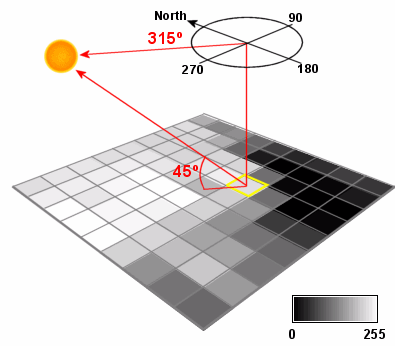.Hillshading computes surface illumination as values from 0 to 255 based on a given compass direction to the sun (azimuth) and a certain altitude above the horizon (altitude)

7. Hillshade_9am (0 to 255 index) - Hillshade index at 9am, summer solstice.

8. Hillshade_Noon (0 to 255 index) - Hillshade index at noon, summer solstice.

9. Hillshade_3pm (0 to 255 index) - Hillshade index at 3pm, summer solstice.

10. Horizontal_Distance_To_Fire_Points - Horz Dist to nearest wildfire ignition points.

11. Wilderness_Area (4 binary columns, 0 = absence or 1 = presence) - Wilderness area designation.

12. Soil_Type (40 binary columns, 0 = absence or 1 = presence) - Soil Type designation.

13. Cover_Type (7 types, integers 1 to 7) - Forest Cover Type designation.

In [8]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 435759 entries, 0 to 435758
Data columns (total 55 columns):
 #   Column                              Non-Null Count   Dtype
---  ------                              --------------   -----
 0   Elevation                           435759 non-null  int64
 1   Aspect                              435759 non-null  int64
 2   Slope                               435759 non-null  int64
 3   Horizontal_Distance_To_Hydrology    435759 non-null  int64
 4   Vertical_Distance_To_Hydrology      435759 non-null  int64
 5   Horizontal_Distance_To_Roadways     435759 non-null  int64
 6   Hillshade_9am                       435759 non-null  int64
 7   Hillshade_Noon                      435759 non-null  int64
 8   Hillshade_3pm                       435759 non-null  int64
 9   Horizontal_Distance_To_Fire_Points  435759 non-null  int64
 10  Wilderness_Area1                    435759 non-null  int64
 11  Wilderness_Area2                    435759 non-null 

In [9]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 145253 entries, 0 to 145252
Data columns (total 54 columns):
 #   Column                              Non-Null Count   Dtype
---  ------                              --------------   -----
 0   Elevation                           145253 non-null  int64
 1   Aspect                              145253 non-null  int64
 2   Slope                               145253 non-null  int64
 3   Horizontal_Distance_To_Hydrology    145253 non-null  int64
 4   Vertical_Distance_To_Hydrology      145253 non-null  int64
 5   Horizontal_Distance_To_Roadways     145253 non-null  int64
 6   Hillshade_9am                       145253 non-null  int64
 7   Hillshade_Noon                      145253 non-null  int64
 8   Hillshade_3pm                       145253 non-null  int64
 9   Horizontal_Distance_To_Fire_Points  145253 non-null  int64
 10  Wilderness_Area1                    145253 non-null  int64
 11  Wilderness_Area2                    145253 non-null 

**There are No Missing Values**

# UniVariate Analysis:-


In [5]:
class Numerical_Summary:
    """
    This Class Gives Numerical Summary.
    It gives Variance, Skewness,Distribution,Missing-Values,Outliers
    """
    def __init__(self, train, features):
        self.train = train
        self.features = features
        self.colors = {
            "Elevation": ["#05e9ff", "#c40031"],
            "Aspect": ["#c40031", "#05e9ff"],
            "Slope": ['#ffbe05', '#54c731'],
            'Horizontal_Distance_To_Hydrology': ['#54c731', '#ffbe05'],
            'Vertical_Distance_To_Hydrology': ['#ff7dee', '#ff7d5e'],
            'Horizontal_Distance_To_Roadways': ['#ff7d5e', '#ff7dee'],
            'Hillshade_9am': ['#fff000', '#00f000'],
            'Hillshade_Noon': ['#00f000', '#fff000'],
            'Hillshade_3pm': ["#ff4f8d", '#4ac5eb'],
            'Horizontal_Distance_To_Fire_Points': ['#4ac5eb', "#ff4f8d"]
        }

    def get_Summary(self):
        for feature in self.features:
            fig = make_subplots(cols=2,
                                subplot_titles=[f'Histogram', f'Box-Plot'])
            fig.add_trace(go.Box(y=self.train[feature],
                                 boxpoints="suspectedoutliers",
                                 marker=dict(color=self.colors[feature][0]),
                                 line_color=self.colors[feature][1],
                                 name="Suspected Outliers"),
                          row=1,
                          col=2)
            fig.add_trace(go.Histogram(x=self.train[feature],
                                       marker_color=self.colors[feature][0]),
                          row=1,
                          col=1)
            fig.update_layout(
                title_text=f"Side by Side Histogram and Box plot of {feature}")
            fig.update_layout(showlegend=False)
            fig['layout']['xaxis'].update(title_text=feature)
            fig['layout']['yaxis'].update(title_text="Frequency")
            fig['layout']['yaxis2'].update(title_text=feature)
            skew = self.train[feature].skew()

            print("=" * 50)
            print(f"Feature:{feature}")
            print(f"Variance:{self.train[feature].var()}")
            print(f"No of Missing Values:{self.train[feature].isnull().sum()}")
            print(f"Mean:{self.train[feature].mean()}")
            print(f"Median:{self.train[feature].median()}")
            print(f"Skew:{self.train[feature].skew()}")

            fig.show()


num_sum = Numerical_Summary(train, numerical_cols)

In [6]:
num_sum.get_Summary()

In [12]:
# Let's Analyse Outliers further
print(len(train[train['Slope']>=65].index))
print(len(test[test['Slope']>=65].index))

2
1


In [13]:
print(len(train[train['Vertical_Distance_To_Hydrology']<0]))
print(len(test[test['Vertical_Distance_To_Hydrology']<0]))

41307
13836


In [14]:
print(len(train[train['Vertical_Distance_To_Hydrology']>570]))
print(len(test[test['Vertical_Distance_To_Hydrology']>570]))

30
7


In [15]:
print(len(train[train['Hillshade_9am']==0]))
print(len(test[test['Hillshade_9am']==0]))

11
2


In [16]:
print(len(train[train['Hillshade_3pm']==0]))
print(len(test[test['Hillshade_3pm']==0]))

991
347


In [28]:
print(len(train[train['Hillshade_Noon']==0]))
print(len(test[test['Hillshade_Noon']==0]))

3
2


In [7]:
# Categorical Summary:
class Categorical_Summary:
    """
    This Class gives Categorical Summary
    It gives Number of Missing Values and Value Counts
    """
    def __init__(self, train, features):
        self.train = train
        self.features = features

    def get_summary(self):
        for feature in self.features:
            print("=" * 50)
            print(f"Feature:{feature}")
            print("Value Counts:-")
            print(self.train[feature].value_counts())

In [18]:
cat_sum=Categorical_Summary(train,categorical_cols)
cat_sum.get_summary()

Feature:Wilderness_Area1
Value Counts:-
0    240381
1    195378
Name: Wilderness_Area1, dtype: int64
Feature:Wilderness_Area2
Value Counts:-
0    413361
1     22398
Name: Wilderness_Area2, dtype: int64
Feature:Wilderness_Area3
Value Counts:-
0    245567
1    190192
Name: Wilderness_Area3, dtype: int64
Feature:Wilderness_Area4
Value Counts:-
0    407968
1     27791
Name: Wilderness_Area4, dtype: int64
Feature:Soil_Type1
Value Counts:-
0    433473
1      2286
Name: Soil_Type1, dtype: int64
Feature:Soil_Type2
Value Counts:-
0    430135
1      5624
Name: Soil_Type2, dtype: int64
Feature:Soil_Type3
Value Counts:-
0    432090
1      3669
Name: Soil_Type3, dtype: int64
Feature:Soil_Type4
Value Counts:-
0    426502
1      9257
Name: Soil_Type4, dtype: int64
Feature:Soil_Type5
Value Counts:-
0    434551
1      1208
Name: Soil_Type5, dtype: int64
Feature:Soil_Type6
Value Counts:-
0    430808
1      4951
Name: Soil_Type6, dtype: int64
Feature:Soil_Type7
Value Counts:-
0    435682
1        77
Name

In [19]:
# From Numerical and Categorical Uni-Variate Analysis some cols need to drop
drop_cols=['soil_type15']

In [20]:
train['Cover_Type'].value_counts()

2    212476
1    158880
3     26816
7     15382
6     13025
5      7120
4      2060
Name: Cover_Type, dtype: int64

In [8]:
mapping_dict = {
    1: 'Spruce/Fir',
    2: 'Lodgepole Pine',
    3: 'Ponderosa Pine',
    4: 'Cottonwood/Willow',
    5: 'Aspen',
    6: 'Douglas-fir',
    7: 'Krummholz'
}
train['Label'] = train['Cover_Type'].apply(lambda x: mapping_dict[x])
colors = [
    "Aqua", 'Aquamarine', "Chartreuse", "Crimson", "Cornsilk", "DarkOrange",
    "DarkTurquoise"
]
fig = go.Figure()
labels, values = train["Label"].value_counts(
).index, train["Label"].value_counts().values
fig.add_trace(
    go.Pie(values=values, labels=labels, marker_colors=colors, hole=0.3))
fig.update_layout(title_text=f"Pie Chart of {target_col}")

# Bi-Variate Analysis

In [38]:
numerical_cols

['Elevation',
 'Aspect',
 'Slope',
 'Horizontal_Distance_To_Hydrology',
 'Vertical_Distance_To_Hydrology',
 'Horizontal_Distance_To_Roadways',
 'Hillshade_9am',
 'Hillshade_Noon',
 'Hillshade_3pm',
 'Horizontal_Distance_To_Fire_Points']

In [41]:
fig=px.scatter(data_frame=train,x='Horizontal_Distance_To_Hydrology',y='Vertical_Distance_To_Hydrology',color="Label")
fig.update_layout(title_text="Scatter Plot of Horizontal Distance Vs Vertical Distance To Hydrology")

In [42]:
train[soil_type_cols].sum(axis=1).sum()

435759

In [43]:
train[wilderness_area_cols].sum(axis=1).sum()

435759

In [44]:
test[wilderness_area_cols].sum(axis=1).sum()

145253

In [45]:
test[soil_type_cols].sum(axis=1).sum()

145253

<AxesSubplot:>

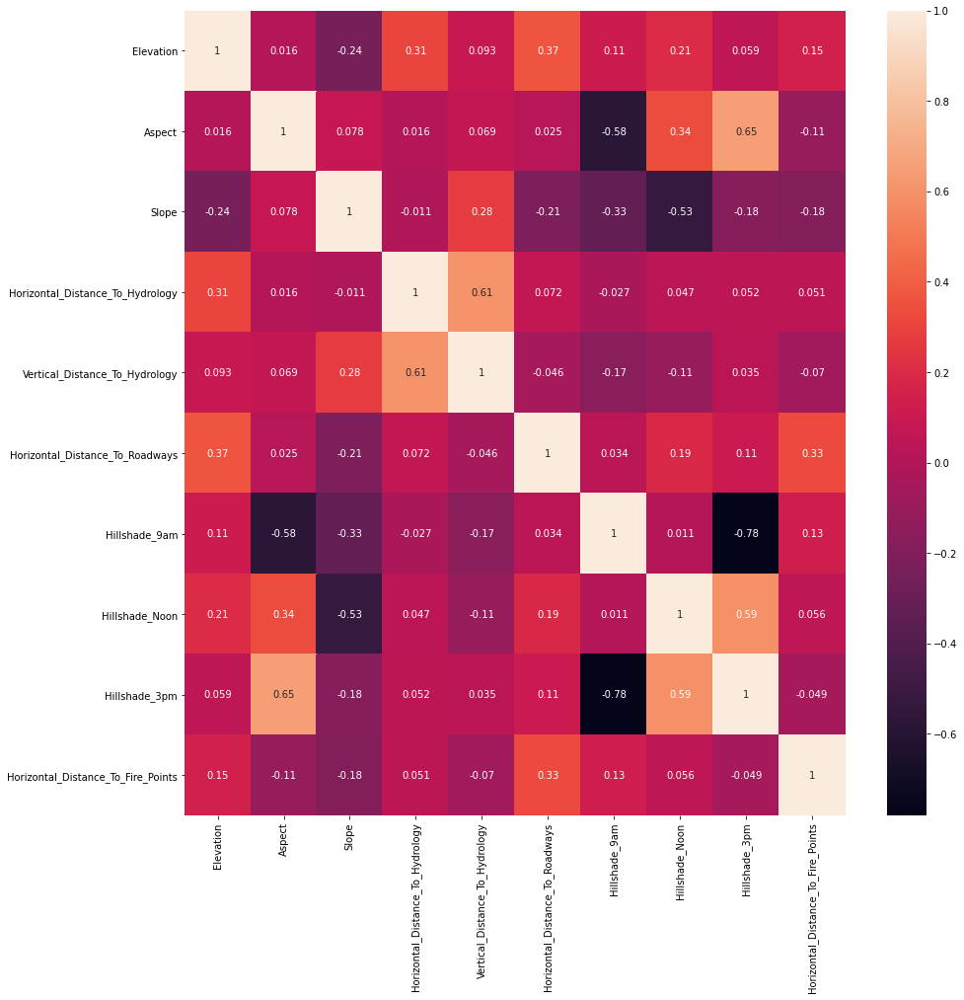

In [46]:
plt.figure(figsize=(15,15))
sns.heatmap(train[numerical_cols].corr(),annot=True)

<AxesSubplot:>

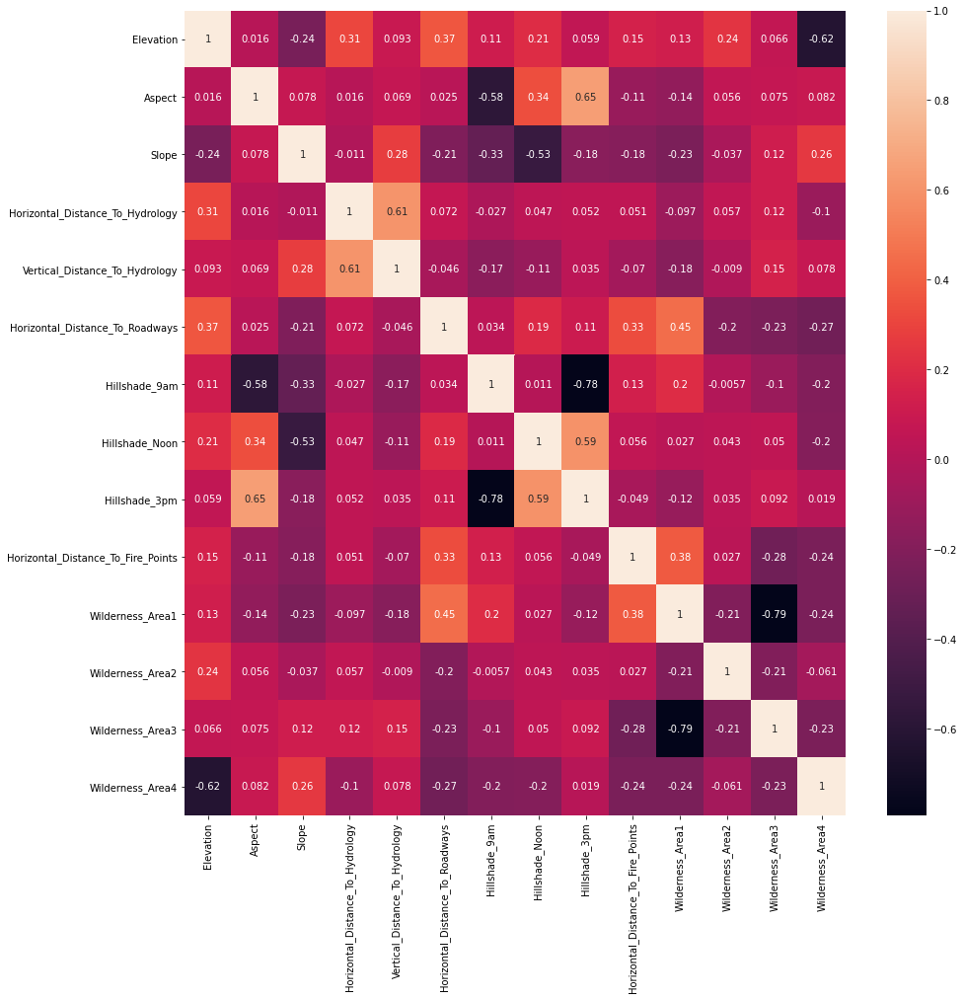

In [47]:
plt.figure(figsize=(15,15))
sns.heatmap(train[numerical_cols+wilderness_area_cols].corr(),annot=True)